# Project : Wine Quality Prediction Using Linear Regression

This datasets is related to red variants of the Portuguese "Vinho Verde" wine. For more details, consult the reference [Cortez et al., 2009]. Due to privacy and logistic issues, only physicochemical (inputs) and sensory (the output) variables are available (e.g. there is no data about grape types, wine brand, wine selling price, etc.).

The datasets can be viewed as classification or regression tasks. The classes are ordered and not balanced (e.g. there are much more normal wines than excellent or poor ones).

This dataset is also available from the UCI machine learning repository, https://archive.ics.uci.edu/ml/datasets/wine+quality , I just shared it to kaggle for convenience. (If I am mistaken and the public license type disallowed me from doing so, I will take this down if requested.)

### Input variables (based on physicochemical tests):
1 - fixed acidity
2 - volatile acidity
3 - citric acid
4 - residual sugar
5 - chlorides
6 - free sulfur dioxide
7 - total sulfur dioxide
8 - density
9 - pH
10 - sulphates
11 - alcohol
Output variable (based on sensory data):
12 - quality (score between 0 and 10)

In [1]:
import os


import pandas as pd
pd.set_option('display.max_column',None)
pd.set_option('display.max_rows', None)

import warnings
warnings.filterwarnings('ignore')

import math
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats 
import statsmodels.api as sm
import statsmodels.formula.api as smf
from statsmodels.formula.api import ols
from statsmodels.stats.multicomp import pairwise_tukeyhsd
from scipy.stats import chi2, chi2_contingency
from statsmodels.stats.multicomp import pairwise_tukeyhsd
from scipy.stats import pearsonr


from sklearn.linear_model import Lasso, LassoCV, Ridge, RidgeCV
from sklearn.model_selection import cross_val_predict, train_test_split
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import SGDRegressor
from sklearn.metrics import mean_squared_error

In [2]:
df = pd.read_csv(r'D:\Uddhav\DATA SCIENCE\ML PROJECTS\Linear Regression Projects\LR SGD\Wine Quality\winequality.csv')
df

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.00,0.270,0.36,20.70,0.045,45.0,170.0,1.001000,3.00,0.45,8.800000,6
1,6.30,0.300,0.34,1.60,0.049,14.0,132.0,0.994000,3.30,0.49,9.500000,6
2,8.10,0.280,0.40,6.90,0.050,30.0,97.0,0.995100,3.26,0.44,10.100000,6
3,7.20,0.230,0.32,8.50,0.058,47.0,186.0,0.995600,3.19,0.40,9.900000,6
4,7.20,0.230,0.32,8.50,0.058,47.0,186.0,0.995600,3.19,0.40,9.900000,6
5,8.10,0.280,0.40,6.90,0.050,30.0,97.0,0.995100,3.26,0.44,10.100000,6
6,6.20,0.320,0.16,7.00,0.045,30.0,136.0,0.994900,3.18,0.47,9.600000,6
7,7.00,0.270,0.36,20.70,0.045,45.0,170.0,1.001000,3.00,0.45,8.800000,6
8,6.30,0.300,0.34,1.60,0.049,14.0,132.0,0.994000,3.30,0.49,9.500000,6
9,8.10,0.220,0.43,1.50,0.044,28.0,129.0,0.993800,3.22,0.45,11.000000,6


## Understanding The data

In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4898 entries, 0 to 4897
Data columns (total 12 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   fixed acidity         4898 non-null   float64
 1   volatile acidity      4898 non-null   float64
 2   citric acid           4898 non-null   float64
 3   residual sugar        4898 non-null   float64
 4   chlorides             4898 non-null   float64
 5   free sulfur dioxide   4898 non-null   float64
 6   total sulfur dioxide  4898 non-null   float64
 7   density               4898 non-null   float64
 8   pH                    4898 non-null   float64
 9   sulphates             4898 non-null   float64
 10  alcohol               4898 non-null   float64
 11  quality               4898 non-null   int64  
dtypes: float64(11), int64(1)
memory usage: 459.3 KB


In [4]:
df.isnull().sum()

fixed acidity           0
volatile acidity        0
citric acid             0
residual sugar          0
chlorides               0
free sulfur dioxide     0
total sulfur dioxide    0
density                 0
pH                      0
sulphates               0
alcohol                 0
quality                 0
dtype: int64

In [5]:
df.describe()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
count,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000
mean,6.854788,0.278241,0.334192,6.391415,0.045772,35.308085,138.360657,0.994027,3.188267,0.489847,10.514267,5.877909
std,0.843868,0.100795,0.121020,5.072058,0.021848,17.007137,42.498065,0.002991,0.151001,0.114126,1.230621,0.885639
min,3.800000,0.080000,0.000000,0.600000,0.009000,2.000000,9.000000,0.987110,2.720000,0.220000,8.000000,3.000000
25%,6.300000,0.210000,0.270000,1.700000,0.036000,23.000000,108.000000,0.991723,3.090000,0.410000,9.500000,5.000000
50%,6.800000,0.260000,0.320000,5.200000,0.043000,34.000000,134.000000,0.993740,3.180000,0.470000,10.400000,6.000000
75%,7.300000,0.320000,0.390000,9.900000,0.050000,46.000000,167.000000,0.996100,3.280000,0.550000,11.400000,6.000000
max,14.200000,1.100000,1.660000,65.800000,0.346000,289.000000,440.000000,1.038980,3.820000,1.080000,14.200000,9.000000


In [6]:
df.columns

Index(['fixed acidity', 'volatile acidity', 'citric acid', 'residual sugar',
       'chlorides', 'free sulfur dioxide', 'total sulfur dioxide', 'density',
       'pH', 'sulphates', 'alcohol', 'quality'],
      dtype='object')

#### Rename columns for ease

In [8]:
df.rename(columns = {'fixed acidity':'fixed_acidity', 
                     'volatile acidity':'volatile_acidity', 
                     'citric acid':'citric_acid', 
                     'residual sugar':'residual_sugar', 
                     'free sulfur dioxide':'free_sulfur_dioxide', 
                     'total sulfur dioxide':'total_sulfur_dioxide', 
                     'pH':'ph'}, inplace=True)

In [9]:
df.columns

Index(['fixed_acidity', 'volatile_acidity', 'citric_acid', 'residual_sugar',
       'chlorides', 'free_sulfur_dioxide', 'total_sulfur_dioxide', 'density',
       'ph', 'sulphates', 'alcohol', 'quality'],
      dtype='object')

#### Replacing any blank rows with Nulls

In [10]:
df.replace(' ',np.nan,inplace=True)

In [11]:
df.isnull().sum()

fixed_acidity           0
volatile_acidity        0
citric_acid             0
residual_sugar          0
chlorides               0
free_sulfur_dioxide     0
total_sulfur_dioxide    0
density                 0
ph                      0
sulphates               0
alcohol                 0
quality                 0
dtype: int64

# Target Variable

In [12]:
df.quality

0       6
1       6
2       6
3       6
4       6
5       6
6       6
7       6
8       6
9       6
10      5
11      5
12      5
13      7
14      5
15      7
16      6
17      8
18      6
19      5
20      8
21      7
22      8
23      5
24      6
25      6
26      6
27      6
28      6
29      7
30      6
31      6
32      6
33      6
34      5
35      5
36      5
37      6
38      5
39      5
40      6
41      6
42      6
43      6
44      6
45      7
46      4
47      5
48      6
49      5
50      6
51      7
52      7
53      6
54      6
55      6
56      6
57      6
58      6
59      6
60      6
61      6
62      5
63      6
64      6
65      5
66      7
67      5
68      8
69      5
70      6
71      5
72      5
73      6
74      8
75      5
76      7
77      7
78      5
79      5
80      6
81      6
82      5
83      6
84      5
85      6
86      6
87      6
88      5
89      6
90      6
91      5
92      7
93      7
94      7
95      6
96      6
97      7
98      4
99      6


In [13]:
df.quality.value_counts()

6    2198
5    1457
7     880
8     175
4     163
3      20
9       5
Name: quality, dtype: int64

<AxesSubplot:xlabel='quality', ylabel='Density'>

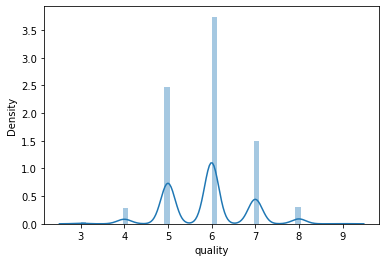

In [14]:
sns.distplot(df.quality)

<AxesSubplot:xlabel='quality', ylabel='count'>

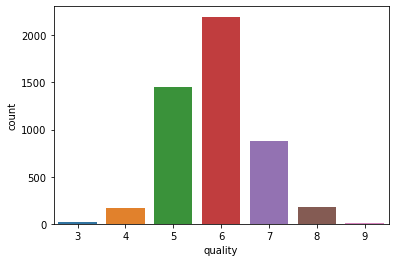

In [15]:
sns.countplot(df.quality)

# Exploratory Data Analysis

## 1. fixed_acidity

In [16]:
df.fixed_acidity

0        7.00
1        6.30
2        8.10
3        7.20
4        7.20
5        8.10
6        6.20
7        7.00
8        6.30
9        8.10
10       8.10
11       8.60
12       7.90
13       6.60
14       8.30
15       6.60
16       6.30
17       6.20
18       7.40
19       6.50
20       6.20
21       6.40
22       6.80
23       7.60
24       6.60
25       7.00
26       6.90
27       7.00
28       7.40
29       7.20
30       8.50
31       8.30
32       7.40
33       6.20
34       5.80
35       7.30
36       6.50
37       7.00
38       7.30
39       7.30
40       6.70
41       6.70
42       7.00
43       6.60
44       6.70
45       7.40
46       6.20
47       6.20
48       7.00
49       6.90
50       7.20
51       6.60
52       6.20
53       6.40
54       6.80
55       6.90
56       7.20
57       6.00
58       6.60
59       7.40
60       6.80
61       6.00
62       7.00
63       6.60
64       7.20
65       6.20
66       6.40
67       6.70
68       6.70
69       7.40
70       6.20
71    

In [17]:
df.fixed_acidity.value_counts()

6.80     308
6.60     290
6.40     280
6.90     241
6.70     236
7.00     232
6.50     225
7.20     206
7.10     200
7.40     194
6.20     192
6.30     188
6.00     184
7.30     178
6.10     155
7.60     153
7.50     123
5.80     121
5.90     103
7.70      93
7.80      93
5.70      88
8.00      80
7.90      74
5.60      71
8.10      56
8.20      56
8.30      52
8.40      35
8.50      32
5.50      31
5.40      28
5.20      28
5.30      27
8.60      25
5.00      24
5.10      23
9.20      21
8.80      18
9.00      17
8.90      16
8.70      15
9.40      11
4.80       9
9.80       8
4.90       7
9.10       6
4.70       5
9.60       5
9.70       4
9.30       3
4.40       3
10.00      3
4.20       2
10.70      2
9.90       2
9.50       2
10.30      2
6.15       2
7.15       2
3.80       1
10.20      1
6.45       1
4.50       1
4.60       1
11.80      1
14.20      1
3.90       1
Name: fixed_acidity, dtype: int64

In [18]:
df.fixed_acidity.isnull().sum()

0

<AxesSubplot:xlabel='fixed_acidity', ylabel='Density'>

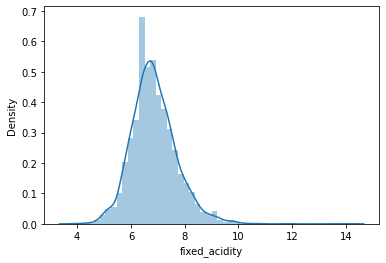

In [19]:
sns.distplot(df.fixed_acidity)

<AxesSubplot:xlabel='fixed_acidity'>

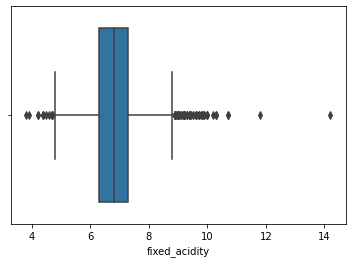

In [20]:
sns.boxplot(df.fixed_acidity)

<AxesSubplot:xlabel='fixed_acidity'>

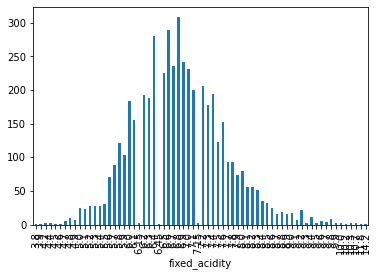

In [21]:
df.groupby('fixed_acidity').count()['quality'].plot(kind = 'bar')

In [22]:
corr,_ = pearsonr(df.fixed_acidity, df.quality)
print('Pearsons Correlation: %.3f'%corr)

Pearsons Correlation: -0.114


Negative Correlation between Fixed acidity and Quality of wine

## 2. volatile_acidity

In [23]:
df.volatile_acidity

0       0.270
1       0.300
2       0.280
3       0.230
4       0.230
5       0.280
6       0.320
7       0.270
8       0.300
9       0.220
10      0.270
11      0.230
12      0.180
13      0.160
14      0.420
15      0.170
16      0.480
17      0.660
18      0.340
19      0.310
20      0.660
21      0.310
22      0.260
23      0.670
24      0.270
25      0.250
26      0.240
27      0.280
28      0.270
29      0.320
30      0.240
31      0.140
32      0.250
33      0.120
34      0.270
35      0.280
36      0.390
37      0.330
38      0.240
39      0.240
40      0.230
41      0.240
42      0.310
43      0.240
44      0.230
45      0.180
46      0.450
47      0.460
48      0.310
49      0.190
50      0.190
51      0.250
52      0.160
53      0.180
54      0.200
55      0.250
56      0.210
57      0.190
58      0.380
59      0.200
60      0.220
61      0.190
62      0.470
63      0.380
64      0.240
65      0.350
66      0.260
67      0.250
68      0.230
69      0.240
70      0.270
71    

In [24]:
df.volatile_acidity.value_counts()

0.280    263
0.240    253
0.260    240
0.250    231
0.220    229
0.270    218
0.230    216
0.200    214
0.300    198
0.210    191
0.320    182
0.180    177
0.190    170
0.290    160
0.310    148
0.160    141
0.170    140
0.340    135
0.330    134
0.360    104
0.150     88
0.350     86
0.370     65
0.380     63
0.390     61
0.400     59
0.140     56
0.410     54
0.440     46
0.130     44
0.420     36
0.430     35
0.120     34
0.460     30
0.450     25
0.480     17
0.470     15
0.490     14
0.500     14
0.550     14
0.110     13
0.255     10
0.540     10
0.510     10
0.520     10
0.345      9
0.560      9
0.530      8
0.610      7
0.600      7
0.580      7
0.335      7
0.640      7
0.100      6
0.105      6
0.620      5
0.185      5
0.670      5
0.265      5
0.285      5
0.155      5
0.660      4
0.080      4
0.415      4
0.205      4
0.225      4
0.235      4
0.445      4
0.305      4
0.615      4
0.245      4
0.315      4
0.570      4
0.145      4
0.590      4
0.115      3
0.275      3

In [25]:
df.volatile_acidity.isnull().sum()

0

<AxesSubplot:xlabel='volatile_acidity', ylabel='Density'>

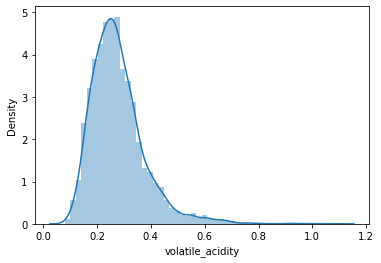

In [26]:
sns.distplot(df.volatile_acidity)

<AxesSubplot:xlabel='volatile_acidity'>

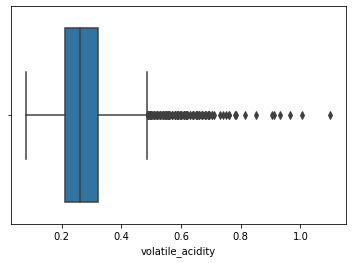

In [27]:
sns.boxplot(df.volatile_acidity)

In [28]:
corr,_ = pearsonr(df.volatile_acidity, df.quality)
print('Pearsons Correlation: %.3f'%corr)

Pearsons Correlation: -0.195


Negative Correlation Between Volatile Acidity and Quality of wine

## 3. citric_acid

In [29]:
df.citric_acid

0       0.36
1       0.34
2       0.40
3       0.32
4       0.32
5       0.40
6       0.16
7       0.36
8       0.34
9       0.43
10      0.41
11      0.40
12      0.37
13      0.40
14      0.62
15      0.38
16      0.04
17      0.48
18      0.42
19      0.14
20      0.48
21      0.38
22      0.42
23      0.14
24      0.41
25      0.32
26      0.35
27      0.39
28      0.48
29      0.36
30      0.39
31      0.34
32      0.36
33      0.34
34      0.20
35      0.43
36      0.23
37      0.32
38      0.39
39      0.39
40      0.39
41      0.39
42      0.26
43      0.27
44      0.26
45      0.31
46      0.26
47      0.25
48      0.26
49      0.35
50      0.31
51      0.29
52      0.33
53      0.35
54      0.59
55      0.35
56      0.34
57      0.26
58      0.15
59      0.36
60      0.24
61      0.26
62      0.07
63      0.15
64      0.27
65      0.03
66      0.24
67      0.13
68      0.31
69      0.29
70      0.43
71      0.23
72      0.28
73      0.46
74      0.31
75      0.29
76      0.36

In [30]:
df.citric_acid.value_counts()

0.30    307
0.28    282
0.32    257
0.34    225
0.29    223
0.26    219
0.27    216
0.49    215
0.31    200
0.33    183
0.24    181
0.36    177
0.35    137
0.25    136
0.37    134
0.38    122
0.40    117
0.22    104
0.39    101
0.42     95
0.23     83
0.41     82
0.20     70
0.21     66
0.44     63
0.46     51
0.18     49
0.19     48
0.45     46
0.74     41
0.48     39
0.47     38
0.43     37
0.50     35
0.16     33
0.14     27
0.17     27
0.51     25
0.15     23
0.52     23
0.56     22
0.58     21
0.12     19
0.00     19
0.54     19
0.13     17
0.53     16
0.62     14
0.10     14
0.57     13
0.07     12
0.09     12
0.04     12
0.55     11
0.61      9
0.71      9
0.65      8
0.67      7
0.66      7
0.68      7
0.01      7
0.60      6
0.64      6
0.02      6
0.06      6
0.59      6
0.73      5
1.00      5
0.05      5
0.69      5
0.72      5
0.63      4
0.08      4
0.70      3
0.80      2
0.82      2
0.79      2
0.78      2
0.91      2
0.03      2
0.81      2
0.88      1
1.66      1
1.23

In [31]:
df.citric_acid.isnull().sum()

0

<AxesSubplot:xlabel='citric_acid', ylabel='Density'>

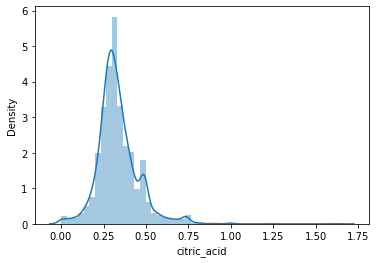

In [32]:
sns.distplot(df.citric_acid)

<AxesSubplot:xlabel='citric_acid'>

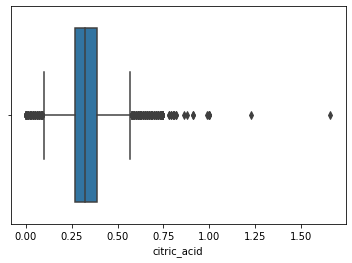

In [33]:
sns.boxplot(df.citric_acid)

In [34]:
corr,_ = pearsonr(df.citric_acid, df.quality)
print('Pearsons Correlation: %.3f'%corr)

Pearsons Correlation: -0.009


Negative Correlation Between citric acid and quality of wine

## 4. residual_sugar

In [35]:
df.residual_sugar

0       20.70
1        1.60
2        6.90
3        8.50
4        8.50
5        6.90
6        7.00
7       20.70
8        1.60
9        1.50
10       1.45
11       4.20
12       1.20
13       1.50
14      19.25
15       1.50
16       1.10
17       1.20
18       1.10
19       7.50
20       1.20
21       2.90
22       1.70
23       1.50
24       1.30
25       9.00
26       1.00
27       8.70
28       1.10
29       2.00
30      10.40
31       1.10
32       2.05
33       1.50
34      14.95
35       1.70
36       5.40
37       1.20
38      17.95
39      17.95
40       2.50
41       2.90
42       7.40
43       1.40
44       1.40
45       1.40
46       4.40
47       4.40
48       7.40
49       5.00
50       1.60
51       1.10
52       1.10
53       1.00
54       0.90
55       1.30
56      11.90
57      12.40
58       4.60
59       1.20
60       4.90
61      12.40
62       1.10
63       4.60
64       1.40
65       1.20
66       6.40
67       1.20
68       2.10
69      10.10
70       7.80
71    

In [36]:
df.residual_sugar.value_counts()

1.20     187
1.40     184
1.60     165
1.30     147
1.10     146
1.50     142
1.70      99
1.80      99
1.00      93
2.00      79
1.90      59
2.20      56
2.10      51
5.00      43
2.30      42
2.40      41
7.80      41
4.60      40
7.40      40
2.50      40
6.30      39
0.90      39
2.70      38
4.80      38
2.80      36
8.20      36
7.10      36
4.90      35
11.80     35
8.10      34
7.70      34
6.40      34
2.60      33
4.50      33
8.00      32
7.90      32
4.20      31
6.20      31
8.30      31
7.00      31
3.50      31
7.50      30
6.60      30
5.70      30
4.70      29
5.20      29
7.20      29
7.60      29
3.20      28
5.10      28
6.80      28
8.60      27
6.50      26
10.70     26
6.70      25
2.90      25
0.80      25
10.40     25
12.80     25
12.90     25
8.50      24
10.20     23
3.30      23
5.80      23
8.90      23
6.00      23
13.10     23
5.40      23
10.60     22
3.60      22
9.70      22
8.80      22
9.20      22
6.10      21
13.70     21
12.10     21
3.80      21

In [37]:
df.residual_sugar.isnull().sum()

0

<AxesSubplot:xlabel='residual_sugar', ylabel='Density'>

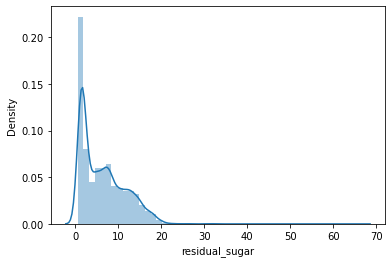

In [38]:
sns.distplot(df.residual_sugar)

<AxesSubplot:xlabel='residual_sugar'>

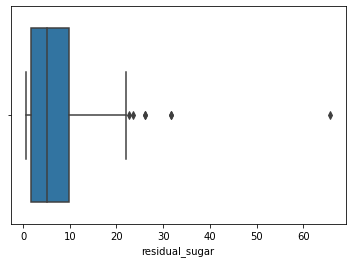

In [39]:
sns.boxplot(df.residual_sugar)

In [40]:
corr,_ = pearsonr(df.residual_sugar, df.quality)
print('Pearsons Correlation: %.3f'%corr)

Pearsons Correlation: -0.098


Negative Correlation between Residual Sugar and Quality of wine

## 5. chlorides

In [41]:
df.chlorides

0       0.045
1       0.049
2       0.050
3       0.058
4       0.058
5       0.050
6       0.045
7       0.045
8       0.049
9       0.044
10      0.033
11      0.035
12      0.040
13      0.044
14      0.040
15      0.032
16      0.046
17      0.029
18      0.033
19      0.044
20      0.029
21      0.038
22      0.049
23      0.074
24      0.052
25      0.046
26      0.052
27      0.051
28      0.047
29      0.033
30      0.044
31      0.042
32      0.050
33      0.045
34      0.044
35      0.080
36      0.051
37      0.053
38      0.057
39      0.057
40      0.172
41      0.173
42      0.069
43      0.057
44      0.060
45      0.058
46      0.063
47      0.066
48      0.069
49      0.067
50      0.062
51      0.068
52      0.057
53      0.045
54      0.147
55      0.039
56      0.043
57      0.048
58      0.044
59      0.038
60      0.092
61      0.048
62      0.035
63      0.044
64      0.038
65      0.064
66      0.040
67      0.041
68      0.046
69      0.050
70      0.056
71    

In [42]:
df.chlorides.value_counts()

0.044    201
0.036    200
0.042    184
0.040    182
0.046    181
0.048    174
0.047    171
0.045    170
0.050    170
0.034    168
0.038    167
0.037    160
0.039    157
0.041    147
0.043    141
0.049    133
0.053    130
0.035    130
0.033    119
0.051    115
0.032    109
0.030    108
0.031    107
0.052    104
0.054     99
0.056     88
0.028     85
0.029     81
0.057     68
0.055     61
0.027     58
0.026     54
0.058     53
0.060     46
0.059     36
0.024     34
0.025     30
0.062     25
0.063     23
0.023     20
0.061     19
0.022     19
0.021     19
0.069     18
0.067     18
0.066     18
0.020     16
0.064     15
0.018     10
0.076      9
0.019      9
0.074      8
0.065      8
0.068      7
0.070      6
0.096      6
0.017      5
0.073      5
0.084      5
0.083      5
0.071      5
0.016      5
0.094      5
0.080      4
0.123      4
0.015      4
0.079      4
0.086      4
0.014      4
0.157      4
0.110      3
0.126      3
0.098      3
0.119      3
0.168      3
0.093      3
0.117      3

In [43]:
df.chlorides.isnull().sum()

0

<AxesSubplot:xlabel='chlorides', ylabel='Density'>

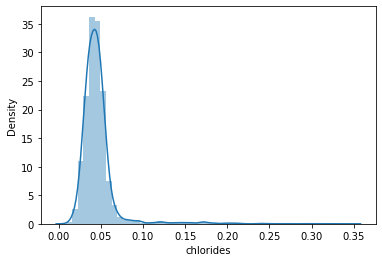

In [44]:
sns.distplot(df.chlorides)

<AxesSubplot:xlabel='chlorides'>

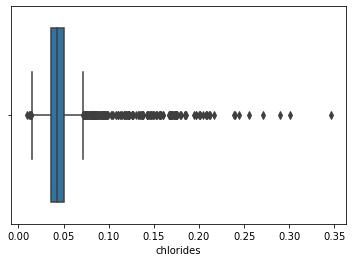

In [45]:
sns.boxplot(df.chlorides)

In [47]:
corr,_ = pearsonr(df.chlorides, df.quality)
print('Pearsons Correlation: %.3f'%corr)

Pearsons Correlation: -0.210


Negative correlation between Chlorides and Quality of wine

## 6. free_sulfur_dioxide

In [48]:
df.free_sulfur_dioxide

0        45.0
1        14.0
2        30.0
3        47.0
4        47.0
5        30.0
6        30.0
7        45.0
8        14.0
9        28.0
10       11.0
11       17.0
12       16.0
13       48.0
14       41.0
15       28.0
16       30.0
17       29.0
18       17.0
19       34.0
20       29.0
21       19.0
22       41.0
23       25.0
24       16.0
25       56.0
26       35.0
27       32.0
28       17.0
29       37.0
30       20.0
31        7.0
32       31.0
33       43.0
34       22.0
35       21.0
36       25.0
37       38.0
38       45.0
39       45.0
40       63.0
41       63.0
42       28.0
43       33.0
44       33.0
45       38.0
46       63.0
47       62.0
48       28.0
49       32.0
50       31.0
51       39.0
52       21.0
53       39.0
54       38.0
55       29.0
56       37.0
57       50.0
58       25.0
59       44.0
60       30.0
61       50.0
62       17.0
63       25.0
64       31.0
65       29.0
66       27.0
67       81.0
68       30.0
69       21.0
70       48.0
71    

In [49]:
df.free_sulfur_dioxide.value_counts()

29.0     160
31.0     132
26.0     129
35.0     129
34.0     128
36.0     127
24.0     118
28.0     112
33.0     112
25.0     111
37.0     111
23.0     110
32.0     109
41.0     104
40.0     103
22.0     102
38.0     102
20.0     101
45.0     101
30.0      99
27.0      99
21.0      93
47.0      91
39.0      89
17.0      89
42.0      86
19.0      84
49.0      82
18.0      80
15.0      79
44.0      75
52.0      72
53.0      68
14.0      68
48.0      66
50.0      64
46.0      64
43.0      63
54.0      61
16.0      58
55.0      58
13.0      55
10.0      55
51.0      54
12.0      51
61.0      47
11.0      45
57.0      44
56.0      42
59.0      39
60.0      38
58.0      37
8.0       35
6.0       32
63.0      30
62.0      29
9.0       29
5.0       25
7.0       25
68.0      24
64.0      23
67.0      22
66.0      17
69.0      17
65.0      14
4.0       11
70.0      11
3.0       10
73.0       8
81.0       7
75.0       7
48.5       7
72.0       6
74.0       5
71.0       5
77.0       5
76.0       5

In [50]:
df.free_sulfur_dioxide.isnull().sum()

0

<AxesSubplot:xlabel='free_sulfur_dioxide', ylabel='Density'>

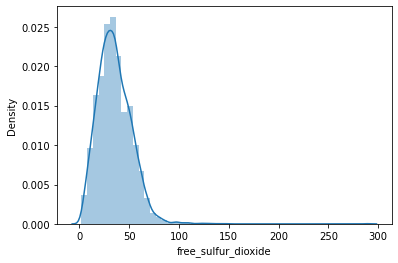

In [51]:
sns.distplot(df.free_sulfur_dioxide)

<AxesSubplot:xlabel='free_sulfur_dioxide'>

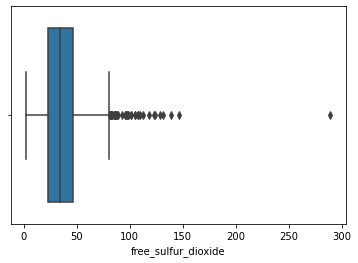

In [52]:
sns.boxplot(df.free_sulfur_dioxide)

In [53]:
Q3_s = df.free_sulfur_dioxide.quantile(0.75)
Q1_s = df.free_sulfur_dioxide.quantile(0.25)
IQR_s = Q3_s - Q1_s

UL_s = Q3_s + (1.5*IQR_s)
LL_s = Q1_s - (1.5*IQR_s)
print('UL: ',UL_s)
print('LL: ',LL_s)



UL:  80.5
LL:  -11.5


In [54]:
df.free_sulfur_dioxide[(df.free_sulfur_dioxide > UL_s)].value_counts().sum()

50

In [55]:
df.free_sulfur_dioxide[(df.free_sulfur_dioxide < LL_s)].value_counts().sum()

0

<AxesSubplot:xlabel='free_sulfur_dioxide'>

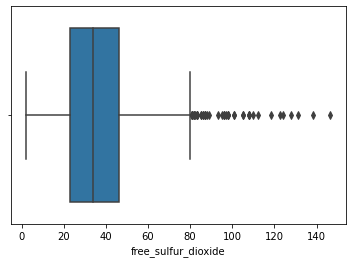

In [56]:
filt = df.free_sulfur_dioxide > 200
df.drop(index = df[filt].index, inplace = True)
sns.boxplot(df.free_sulfur_dioxide)

<AxesSubplot:xlabel='free_sulfur_dioxide', ylabel='Density'>

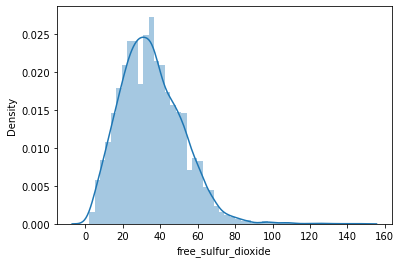

In [57]:
sns.distplot(df.free_sulfur_dioxide)

In [63]:
corr,_ = pearsonr(df.free_sulfur_dioxide, df.quality)
print('Pearsons Correlation: %.3f'%corr)

Pearsons Correlation: 0.019


Positive correlation Between Free Sulfur Dioxied and Quality of wine

## 7. total sulfur dioxide

In [58]:
df.total_sulfur_dioxide

0       170.0
1       132.0
2        97.0
3       186.0
4       186.0
5        97.0
6       136.0
7       170.0
8       132.0
9       129.0
10       63.0
11      109.0
12       75.0
13      143.0
14      172.0
15      112.0
16       99.0
17       75.0
18      171.0
19      133.0
20       75.0
21      102.0
22      122.0
23      168.0
24      142.0
25      245.0
26      146.0
27      141.0
28      132.0
29      114.0
30      142.0
31       47.0
32      100.0
33      117.0
34      179.0
35      123.0
36      149.0
37      138.0
38      149.0
39      149.0
40      158.0
41      157.0
42      160.0
43      152.0
44      154.0
45      167.0
46      206.0
47      207.0
48      160.0
49      150.0
50      173.0
51      124.0
52       82.0
53      108.0
54      132.0
55      191.0
56      213.0
57      147.0
58       78.0
59      111.0
60      123.0
61      147.0
62      151.0
63       78.0
64      122.0
65      120.0
66      124.0
67      174.0
68       96.0
69      105.0
70      244.0
71    

In [59]:
df.total_sulfur_dioxide.value_counts()

111.0    69
113.0    61
117.0    57
118.0    55
128.0    54
114.0    54
150.0    54
122.0    54
124.0    53
140.0    52
126.0    50
133.0    50
125.0    49
98.0     49
149.0    48
134.0    47
110.0    47
116.0    47
156.0    47
119.0    47
131.0    47
101.0    47
132.0    47
130.0    46
142.0    46
107.0    45
138.0    45
115.0    45
148.0    44
143.0    44
104.0    44
152.0    43
168.0    43
93.0     42
120.0    42
97.0     41
178.0    41
105.0    41
135.0    41
87.0     39
166.0    39
151.0    39
155.0    39
127.0    38
158.0    38
136.0    38
121.0    37
102.0    37
100.0    37
161.0    37
109.0    37
163.0    36
183.0    35
144.0    35
159.0    34
99.0     34
95.0     34
103.0    34
180.0    34
162.0    34
123.0    33
106.0    32
153.0    32
170.0    32
173.0    32
108.0    32
160.0    32
129.0    32
167.0    32
147.0    31
146.0    31
112.0    31
157.0    31
90.0     30
145.0    30
184.0    30
189.0    30
182.0    30
92.0     30
141.0    29
169.0    29
172.0    28
197.0    28
174.

In [60]:
df.total_sulfur_dioxide.isnull().sum()

0

<AxesSubplot:xlabel='total_sulfur_dioxide', ylabel='Density'>

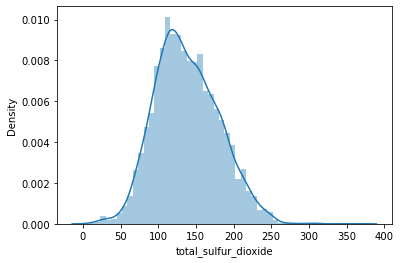

In [61]:
sns.distplot(df.total_sulfur_dioxide)

<AxesSubplot:xlabel='total_sulfur_dioxide'>

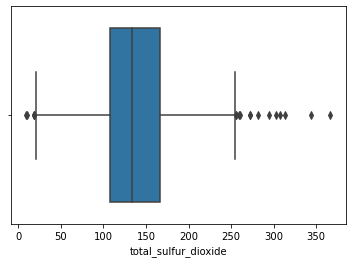

In [62]:
sns.boxplot(df.total_sulfur_dioxide)

In [64]:
corr,_ = pearsonr(df.total_sulfur_dioxide, df.quality)
print('Pearsons Correlation: %.3f'%corr)

Pearsons Correlation: -0.171


Negative Correlation between Total sulfur dioxied and Quality of wine

## 8. density

In [65]:
df.density

0       1.001000
1       0.994000
2       0.995100
3       0.995600
4       0.995600
5       0.995100
6       0.994900
7       1.001000
8       0.994000
9       0.993800
10      0.990800
11      0.994700
12      0.992000
13      0.991200
14      1.000200
15      0.991400
16      0.992800
17      0.989200
18      0.991700
19      0.995500
20      0.989200
21      0.991200
22      0.993000
23      0.993700
24      0.995100
25      0.995500
26      0.993000
27      0.996100
28      0.991400
29      0.990600
30      0.997400
31      0.993400
32      0.992000
33      0.993900
34      0.996200
35      0.990500
36      0.993400
37      0.990600
38      0.999900
39      0.999900
40      0.993700
41      0.993700
42      0.995400
43      0.993400
44      0.993400
45      0.993100
46      0.994000
47      0.993900
48      0.995400
49      0.995000
50      0.991700
51      0.991400
52      0.991000
53      0.991100
54      0.993000
55      0.990800
56      0.996200
57      0.997200
58      0.9931

In [66]:
df.density.value_counts()

0.992000    64
0.992800    61
0.993200    53
0.993000    52
0.993400    50
0.993800    49
0.992700    47
0.994400    46
0.994800    45
0.995400    44
0.992400    44
0.998600    42
0.995600    41
0.995800    40
0.991800    40
0.991400    39
0.994200    38
0.994000    37
0.995200    37
0.996600    36
0.993700    35
0.998000    35
0.993600    34
0.991000    34
0.997600    34
0.991700    34
0.997200    33
0.991200    33
0.994600    32
0.990600    32
0.992600    32
0.995300    32
0.996200    31
0.995500    30
0.998400    29
0.993900    28
0.993100    28
0.990000    28
0.998200    28
0.997400    28
0.992200    27
0.991100    25
0.994100    25
0.995100    25
0.990800    25
0.995000    25
0.997900    24
0.997800    23
0.991600    23
0.995900    23
0.992500    22
0.994500    22
0.998300    21
0.997000    21
0.996000    20
0.996800    20
0.994900    20
0.990200    20
0.992900    20
0.992300    19
1.000000    19
0.996500    18
0.996300    18
0.996400    18
0.989800    18
0.997500    17
0.993300  

In [67]:
df.density.isnull().sum()

0

<AxesSubplot:xlabel='density', ylabel='Density'>

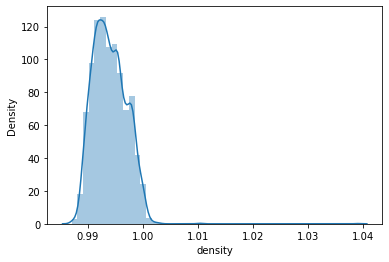

In [68]:
sns.distplot(df.density)

<AxesSubplot:xlabel='density'>

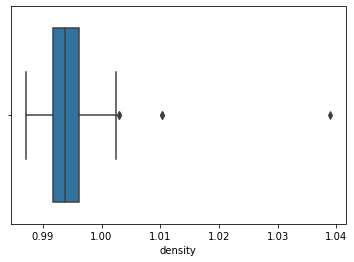

In [69]:
sns.boxplot(df.density)

#### Outlier Treatment

In [70]:
Q3_s = df.density.quantile(0.75)
Q1_s = df.density.quantile(0.25)
IQR_s = Q3_s - Q1_s

UL_s = Q3_s + (1.5*IQR_s)
LL_s = Q1_s - (1.5*IQR_s)
print('UL: ',UL_s)
print('LL: ',LL_s)



UL:  1.00267
LL:  0.9851500000000002


<AxesSubplot:xlabel='free_sulfur_dioxide'>

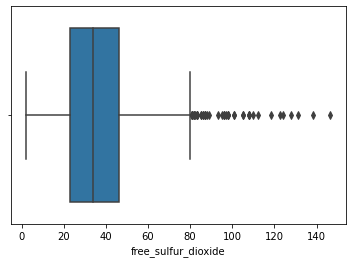

In [71]:
filt = df.density > 1.03
df.drop(index = df[filt].index, inplace = True)
sns.boxplot(df.free_sulfur_dioxide)

<AxesSubplot:xlabel='density', ylabel='Density'>

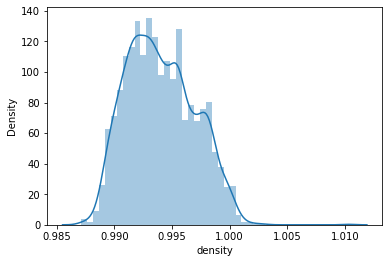

In [72]:
sns.distplot(df.density)

In [78]:
corr,_ = pearsonr(df.density, df.quality)
print('Pearsons Correlation: %.3f'%corr)

Pearsons Correlation: -0.315


Negative Correlation between density and quality of wine

## 9. ph

In [73]:
df.ph

0       3.00
1       3.30
2       3.26
3       3.19
4       3.19
5       3.26
6       3.18
7       3.00
8       3.30
9       3.22
10      2.99
11      3.14
12      3.18
13      3.54
14      2.98
15      3.25
16      3.24
17      3.33
18      3.12
19      3.22
20      3.33
21      3.17
22      3.47
23      3.05
24      3.42
25      3.25
26      3.45
27      3.38
28      3.19
29      3.10
30      3.20
31      3.47
32      3.19
33      3.42
34      3.37
35      3.19
36      3.24
37      3.13
38      3.21
39      3.21
40      3.11
41      3.10
42      3.13
43      3.22
44      3.24
45      3.16
46      3.27
47      3.25
48      3.13
49      3.36
50      3.35
51      3.34
52      3.32
53      3.31
54      3.05
55      3.13
56      3.09
57      3.30
58      3.11
59      3.36
60      3.03
61      3.30
62      3.02
63      3.11
64      3.15
65      3.22
66      3.22
67      3.14
68      3.33
69      3.13
70      3.10
71      3.32
72      3.69
73      2.95
74      3.33
75      3.13
76      3.26

In [74]:
df.ph.value_counts()

3.14    172
3.16    164
3.22    146
3.19    145
3.18    138
3.20    137
3.15    136
3.08    136
3.10    135
3.12    134
3.24    132
3.11    126
3.17    124
3.13    117
3.23    116
3.06    115
3.25    114
3.04     97
3.26     96
3.21     95
3.30     93
3.09     92
3.05     89
3.27     88
3.28     87
3.32     86
3.36     83
3.29     82
3.34     79
3.31     79
3.07     79
3.03     78
3.00     74
3.02     68
2.99     68
2.96     63
3.38     58
3.37     49
3.33     49
3.01     49
3.35     48
3.42     48
2.98     41
3.39     39
3.40     39
2.93     38
2.94     35
2.97     32
3.44     32
2.90     31
3.41     30
3.46     28
2.95     26
3.49     23
3.47     21
3.48     21
3.43     20
2.92     18
3.45     17
3.52     17
2.89     17
3.50     15
2.91     15
3.51     14
3.54     14
3.53     13
2.88     11
3.55      9
2.86      9
2.85      9
2.87      9
3.56      8
3.60      7
3.59      6
3.63      6
3.58      5
3.66      5
3.57      5
3.65      4
2.83      4
2.79      3
2.80      3
3.61      3
3.72

In [75]:
df.ph.isnull().sum()

0

<AxesSubplot:xlabel='ph', ylabel='Density'>

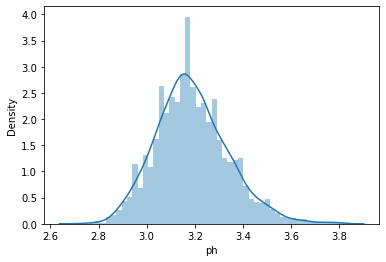

In [76]:
sns.distplot(df.ph)

<AxesSubplot:xlabel='ph'>

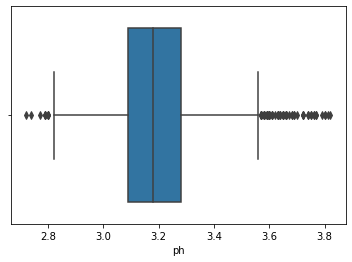

In [77]:
sns.boxplot(df.ph)

In [79]:
corr,_ = pearsonr(df.ph, df.quality)
print('Pearsons Correlation: %.3f'%corr)

Pearsons Correlation: 0.101


Positive correlation between Ph and Wine quality

## 10. sulphates

In [80]:
df.sulphates

0       0.45
1       0.49
2       0.44
3       0.40
4       0.40
5       0.44
6       0.47
7       0.45
8       0.49
9       0.45
10      0.56
11      0.53
12      0.63
13      0.52
14      0.67
15      0.55
16      0.36
17      0.39
18      0.53
19      0.50
20      0.39
21      0.35
22      0.48
23      0.51
24      0.47
25      0.50
26      0.44
27      0.53
28      0.49
29      0.71
30      0.53
31      0.40
32      0.44
33      0.51
34      0.37
35      0.42
36      0.35
37      0.28
38      0.36
39      0.36
40      0.36
41      0.34
42      0.46
43      0.56
44      0.56
45      0.53
46      0.52
47      0.52
48      0.46
49      0.48
50      0.44
51      0.58
52      0.46
53      0.35
54      0.38
55      0.52
56      0.50
57      0.36
58      0.38
59      0.34
60      0.46
61      0.36
62      0.34
63      0.38
64      0.46
65      0.54
66      0.49
67      0.42
68      0.64
69      0.35
70      0.51
71      0.60
72      0.71
73      0.49
74      0.64
75      0.35
76      0.37

In [81]:
df.sulphates.value_counts()

0.50    249
0.46    225
0.44    216
0.38    214
0.42    181
0.48    179
0.45    178
0.47    172
0.40    168
0.54    167
0.49    166
0.43    161
0.52    156
0.39    151
0.51    140
0.41    139
0.53    135
0.37    129
0.36    120
0.56    108
0.55    102
0.58     99
0.59     97
0.60     88
0.35     85
0.34     84
0.57     83
0.62     68
0.64     66
0.33     59
0.32     54
0.63     48
0.61     45
0.68     44
0.66     36
0.31     35
0.67     35
0.72     33
0.30     31
0.69     29
0.65     28
0.70     27
0.75     22
0.76     19
0.78     19
0.74     19
0.71     18
0.79     16
0.29     16
0.77     16
0.82     13
0.27     13
0.28     13
0.73     12
0.88      7
0.98      6
0.81      5
0.95      5
0.90      5
0.80      5
0.26      4
0.84      4
0.25      4
0.85      3
0.96      3
0.86      2
0.87      2
0.92      2
0.94      2
0.83      2
0.97      1
1.06      1
1.00      1
0.89      1
0.99      1
0.22      1
0.23      1
1.01      1
1.08      1
Name: sulphates, dtype: int64

In [82]:
df.sulphates.isnull().sum()

0

<AxesSubplot:xlabel='sulphates', ylabel='Density'>

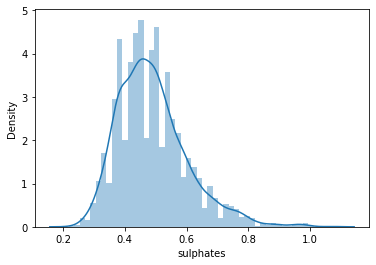

In [83]:
sns.distplot(df.sulphates)

<AxesSubplot:xlabel='sulphates'>

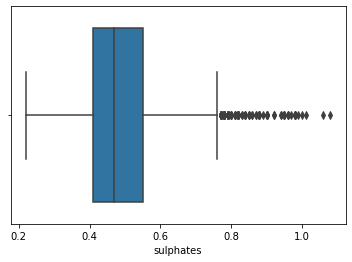

In [84]:
sns.boxplot(df.sulphates)

In [85]:
corr,_ = pearsonr(df.sulphates, df.quality)
print('Pearsons Correlation: %.3f'%corr)

Pearsons Correlation: 0.055


Positive correlation between sulphates and wine quality

## 11. alcohol

In [86]:
df.alcohol

0        8.800000
1        9.500000
2       10.100000
3        9.900000
4        9.900000
5       10.100000
6        9.600000
7        8.800000
8        9.500000
9       11.000000
10      12.000000
11       9.700000
12      10.800000
13      12.400000
14       9.700000
15      11.400000
16       9.600000
17      12.800000
18      11.300000
19       9.500000
20      12.800000
21      11.000000
22      10.500000
23       9.300000
24      10.000000
25      10.400000
26      10.000000
27      10.500000
28      11.600000
29      12.300000
30      10.000000
31      10.200000
32      10.800000
33       9.000000
34      10.200000
35      12.800000
36      10.000000
37      11.200000
38       8.600000
39       8.600000
40       9.400000
41       9.400000
42       9.800000
43       9.500000
44       9.500000
45      10.000000
46       9.800000
47       9.800000
48       9.800000
49       9.800000
50      11.700000
51      11.000000
52      10.900000
53      10.900000
54       9.100000
55      11

In [87]:
df.alcohol.value_counts()

9.400000     229
9.500000     228
9.200000     199
9.000000     185
10.000000    162
10.500000    159
11.000000    158
10.400000    153
9.100000     144
9.800000     136
10.800000    135
9.300000     134
10.200000    130
9.600000     128
11.400000    121
10.600000    114
10.100000    114
11.200000    112
9.900000     109
8.800000     107
9.700000     105
12.000000    102
11.300000    101
10.700000     96
8.900000      95
11.500000     88
10.900000     88
12.200000     86
10.300000     85
11.100000     83
12.500000     83
8.700000      78
12.400000     68
12.600000     63
12.300000     62
11.800000     60
11.700000     57
12.700000     56
12.800000     54
11.900000     53
12.100000     51
11.600000     46
12.900000     39
13.000000     36
8.600000      23
13.400000     20
13.100000     18
13.200000     14
13.500000     12
13.600000      9
8.500000       9
13.300000      7
13.700000      7
14.000000      5
11.450000      4
13.900000      3
8.400000       3
10.966667      3
12.750000     

In [88]:
df.alcohol.isnull().sum()

0

<AxesSubplot:xlabel='alcohol', ylabel='Density'>

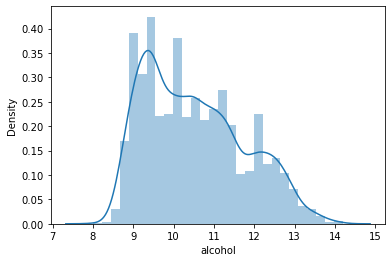

In [90]:
sns.distplot(df.alcohol)

<AxesSubplot:xlabel='alcohol'>

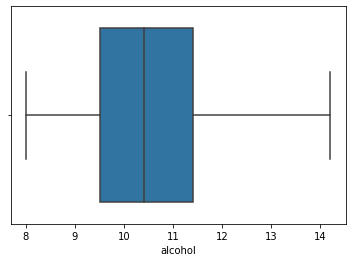

In [91]:
sns.boxplot(df.alcohol)

In [93]:
corr,_ = pearsonr(df.alcohol, df.quality)
print('Pearsons Correlation: %.3f'%corr)

Pearsons Correlation: 0.436


Highly Correlated

# Model building

fixed_acidity          -0.114436
volatile_acidity       -0.196178
citric_acid            -0.009748
residual_sugar         -0.099883
chlorides              -0.210196
free_sulfur_dioxide     0.018555
total_sulfur_dioxide   -0.171112
density                -0.315440
ph                      0.100652
sulphates               0.054588
alcohol                 0.436053
quality                 1.000000
Name: quality, dtype: float64

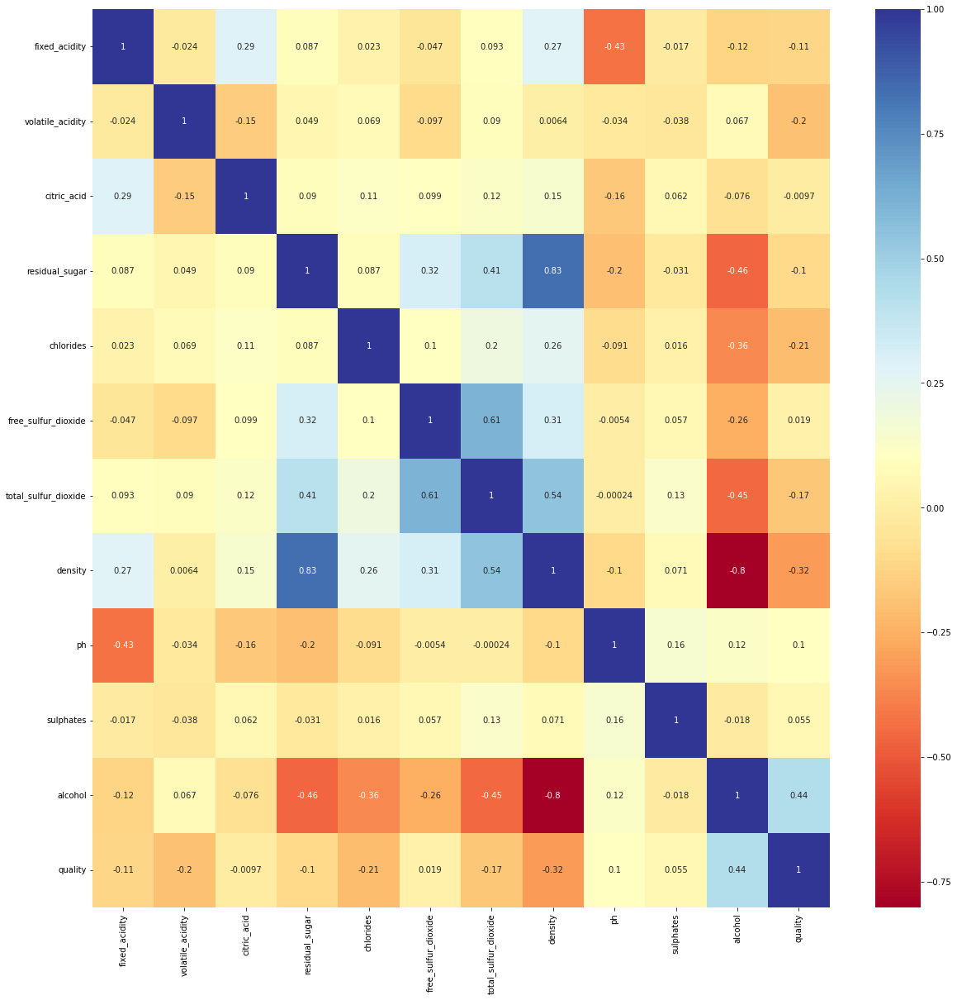

In [96]:
fig, ax = plt.subplots(figsize = (20,20)) 
sns.heatmap(df.corr(),annot = True, cmap='RdYlBu')
df.corr()['quality']

In [97]:
df.to_csv(r'D:\wine_new.csv', index=False)

In [98]:
x = df.loc[:, df.columns != 'quality']
x.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4896 entries, 0 to 4897
Data columns (total 11 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   fixed_acidity         4896 non-null   float64
 1   volatile_acidity      4896 non-null   float64
 2   citric_acid           4896 non-null   float64
 3   residual_sugar        4896 non-null   float64
 4   chlorides             4896 non-null   float64
 5   free_sulfur_dioxide   4896 non-null   float64
 6   total_sulfur_dioxide  4896 non-null   float64
 7   density               4896 non-null   float64
 8   ph                    4896 non-null   float64
 9   sulphates             4896 non-null   float64
 10  alcohol               4896 non-null   float64
dtypes: float64(11)
memory usage: 459.0 KB


In [99]:
y = df.quality
y

0       6
1       6
2       6
3       6
4       6
5       6
6       6
7       6
8       6
9       6
10      5
11      5
12      5
13      7
14      5
15      7
16      6
17      8
18      6
19      5
20      8
21      7
22      8
23      5
24      6
25      6
26      6
27      6
28      6
29      7
30      6
31      6
32      6
33      6
34      5
35      5
36      5
37      6
38      5
39      5
40      6
41      6
42      6
43      6
44      6
45      7
46      4
47      5
48      6
49      5
50      6
51      7
52      7
53      6
54      6
55      6
56      6
57      6
58      6
59      6
60      6
61      6
62      5
63      6
64      6
65      5
66      7
67      5
68      8
69      5
70      6
71      5
72      5
73      6
74      8
75      5
76      7
77      7
78      5
79      5
80      6
81      6
82      5
83      6
84      5
85      6
86      6
87      6
88      5
89      6
90      6
91      5
92      7
93      7
94      7
95      6
96      6
97      7
98      4
99      6


In [100]:
xtrain, xtest, ytrain, ytest = train_test_split(x,y, test_size=0.20, random_state=0)

In [101]:
sc_x = StandardScaler()
xtrain = sc_x.fit_transform(xtrain)
xtest = sc_x.transform(xtest)

In [102]:
xtrain.shape

(3916, 11)

In [103]:
xtest.shape

(980, 11)

In [104]:
ytrain.shape

(3916,)

In [105]:
ytest.shape

(980,)

In [106]:
sgdr = SGDRegressor()
sgdr.fit(xtrain,ytrain)
score = sgdr.score(xtrain, ytrain)
print('R-Square: ', score)

R-Square:  0.28687088163481456


In [107]:
y_pred = sgdr.predict(xtest)
mse = mean_squared_error(ytest, y_pred)
print('MSE: ', mse)
print('RMSE: ', np.sqrt(mse))

MSE:  0.6196660265502649
RMSE:  0.7871886854816099


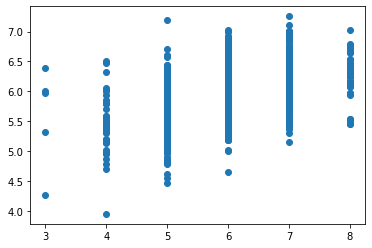

In [108]:
plt.scatter(ytest,y_pred)

# Model 2

In [115]:
df.drop(columns=['fixed_acidity', 'volatile_acidity', 'citric_acid', 'residual_sugar',
       'chlorides', 'free_sulfur_dioxide', 'total_sulfur_dioxide', 'density'],axis =1, inplace=True)

In [116]:
x = df.loc[:, df.columns != 'quality']
x.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4896 entries, 0 to 4897
Data columns (total 3 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   ph         4896 non-null   float64
 1   sulphates  4896 non-null   float64
 2   alcohol    4896 non-null   float64
dtypes: float64(3)
memory usage: 153.0 KB


In [117]:
y = df.quality
y

0       6
1       6
2       6
3       6
4       6
5       6
6       6
7       6
8       6
9       6
10      5
11      5
12      5
13      7
14      5
15      7
16      6
17      8
18      6
19      5
20      8
21      7
22      8
23      5
24      6
25      6
26      6
27      6
28      6
29      7
30      6
31      6
32      6
33      6
34      5
35      5
36      5
37      6
38      5
39      5
40      6
41      6
42      6
43      6
44      6
45      7
46      4
47      5
48      6
49      5
50      6
51      7
52      7
53      6
54      6
55      6
56      6
57      6
58      6
59      6
60      6
61      6
62      5
63      6
64      6
65      5
66      7
67      5
68      8
69      5
70      6
71      5
72      5
73      6
74      8
75      5
76      7
77      7
78      5
79      5
80      6
81      6
82      5
83      6
84      5
85      6
86      6
87      6
88      5
89      6
90      6
91      5
92      7
93      7
94      7
95      6
96      6
97      7
98      4
99      6


In [119]:
xtrain, xtest, ytrain, ytest = train_test_split(x,y, test_size=0.20, random_state=0)

In [120]:
sc_x = StandardScaler()
xtrain = sc_x.fit_transform(xtrain)
xtest = sc_x.transform(xtest)

In [121]:
sgdr = SGDRegressor()
sgdr.fit(xtrain,ytrain)
score = sgdr.score(xtrain, ytrain)
print('R-Square: ', score)

R-Square:  0.1995097860760755


# Model 3

In [123]:
df1 = pd.read_csv(r'D:\Uddhav\DATA SCIENCE\ML PROJECTS\Linear Regression Projects\LR SGD\Wine Quality\wine_new.csv')
df1

,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,ph,sulphates,alcohol,quality
0,7.00,0.270,0.36,20.70,0.045,45.0,170.0,1.001000,3.00,0.45,8.800000,6
1,6.30,0.300,0.34,1.60,0.049,14.0,132.0,0.994000,3.30,0.49,9.500000,6
2,8.10,0.280,0.40,6.90,0.050,30.0,97.0,0.995100,3.26,0.44,10.100000,6
3,7.20,0.230,0.32,8.50,0.058,47.0,186.0,0.995600,3.19,0.40,9.900000,6
4,7.20,0.230,0.32,8.50,0.058,47.0,186.0,0.995600,3.19,0.40,9.900000,6
5,8.10,0.280,0.40,6.90,0.050,30.0,97.0,0.995100,3.26,0.44,10.100000,6
6,6.20,0.320,0.16,7.00,0.045,30.0,136.0,0.994900,3.18,0.47,9.600000,6
7,7.00,0.270,0.36,20.70,0.045,45.0,170.0,1.001000,3.00,0.45,8.800000,6
8,6.30,0.300,0.34,1.60,0.049,14.0,132.0,0.994000,3.30,0.49,9.500000,6
9,8.10,0.220,0.43,1.50,0.044,28.0,129.0,0.993800,3.22,0.45,11.000000,6


In [136]:
df1.quality.unique()

array([6, 5, 7, 8, 4, 3, 9], dtype=int64)

In [137]:
df1.quality.value_counts()

6    2197
5    1457
7     880
8     175
4     163
3      19
9       5
Name: quality, dtype: int64

In [138]:
df1.quality.replace(5,3,inplace=True)
df1.quality.replace(4,3,inplace=True)

In [139]:
df1.quality.replace(3,0,inplace=True)

In [140]:
df1.quality.replace(6,1,inplace=True)

In [141]:
df1.quality.replace(8,7,inplace=True)
df1.quality.replace(9,7,inplace=True)
df1.quality.replace(7,2,inplace=True)

In [143]:
df1

,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,ph,sulphates,alcohol,quality
0,7.00,0.270,0.36,20.70,0.045,45.0,170.0,1.001000,3.00,0.45,8.800000,1
1,6.30,0.300,0.34,1.60,0.049,14.0,132.0,0.994000,3.30,0.49,9.500000,1
2,8.10,0.280,0.40,6.90,0.050,30.0,97.0,0.995100,3.26,0.44,10.100000,1
3,7.20,0.230,0.32,8.50,0.058,47.0,186.0,0.995600,3.19,0.40,9.900000,1
4,7.20,0.230,0.32,8.50,0.058,47.0,186.0,0.995600,3.19,0.40,9.900000,1
5,8.10,0.280,0.40,6.90,0.050,30.0,97.0,0.995100,3.26,0.44,10.100000,1
6,6.20,0.320,0.16,7.00,0.045,30.0,136.0,0.994900,3.18,0.47,9.600000,1
7,7.00,0.270,0.36,20.70,0.045,45.0,170.0,1.001000,3.00,0.45,8.800000,1
8,6.30,0.300,0.34,1.60,0.049,14.0,132.0,0.994000,3.30,0.49,9.500000,1
9,8.10,0.220,0.43,1.50,0.044,28.0,129.0,0.993800,3.22,0.45,11.000000,1


In [144]:
x = df1.loc[:, df1.columns != 'quality']
x.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4896 entries, 0 to 4895
Data columns (total 11 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   fixed_acidity         4896 non-null   float64
 1   volatile_acidity      4896 non-null   float64
 2   citric_acid           4896 non-null   float64
 3   residual_sugar        4896 non-null   float64
 4   chlorides             4896 non-null   float64
 5   free_sulfur_dioxide   4896 non-null   float64
 6   total_sulfur_dioxide  4896 non-null   float64
 7   density               4896 non-null   float64
 8   ph                    4896 non-null   float64
 9   sulphates             4896 non-null   float64
 10  alcohol               4896 non-null   float64
dtypes: float64(11)
memory usage: 420.9 KB


In [146]:
y = df1.quality
y

0       1
1       1
2       1
3       1
4       1
5       1
6       1
7       1
8       1
9       1
10      0
11      0
12      0
13      2
14      0
15      2
16      1
17      2
18      1
19      0
20      2
21      2
22      2
23      0
24      1
25      1
26      1
27      1
28      1
29      2
30      1
31      1
32      1
33      1
34      0
35      0
36      0
37      1
38      0
39      0
40      1
41      1
42      1
43      1
44      1
45      2
46      0
47      0
48      1
49      0
50      1
51      2
52      2
53      1
54      1
55      1
56      1
57      1
58      1
59      1
60      1
61      1
62      0
63      1
64      1
65      0
66      2
67      0
68      2
69      0
70      1
71      0
72      0
73      1
74      2
75      0
76      2
77      2
78      0
79      0
80      1
81      1
82      0
83      1
84      0
85      1
86      1
87      1
88      0
89      1
90      1
91      0
92      2
93      2
94      2
95      1
96      1
97      2
98      0
99      1


In [147]:
xtrain, xtest, ytrain, ytest = train_test_split(x,y, test_size=0.20, random_state=0)

In [148]:
sc_x = StandardScaler()
xtrain = sc_x.fit_transform(xtrain)
xtest = sc_x.transform(xtest)

In [149]:
sgdr = SGDRegressor()
sgdr.fit(xtrain,ytrain)
score = sgdr.score(xtrain, ytrain)
print('R-Square: ', score)

R-Square:  0.30031631219848676


In [150]:
y_pred = sgdr.predict(xtest)
mse = mean_squared_error(ytest, y_pred)
print('MSE: ', mse)
print('RMSE: ', np.sqrt(mse))

MSE:  0.3944896269917883
RMSE:  0.6280840922932122


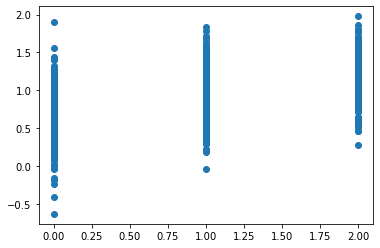

In [151]:
plt.scatter(ytest,y_pred)

# This Dataset will work better with some other Algorithm than Linear Regression